In [1]:
import sys
sys.dont_write_bytecode = True

import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats as st
from lib.utils import imshow, histograms
from lib.misc import generate_histogram, otsu
from lib.colors import color_balance, equalize, binarize
from lib.kernel import create_gaussian_kernel
from lib.transform import custom_transform, median_transform


import contextlib
with contextlib.redirect_stdout(None):
    np.seterr(divide='ignore', invalid='ignore')

%matplotlib inline

In [34]:
def remove_noise(image):
    image[image <= 20] = 0
    return image

def find_mode_hist(*images, range = range(0, 256)):
    mode = lambda h, r: r[0] + np.argmax(np.array(h)[r[0]:r[-1]])
    return [mode(generate_histogram(image), list(range)) for image in images]

def remove_text(images):
    for image in images:
        h, w = image.shape
        image[0:h,0:60] = 0
        image[0:h,w-60:w] = 0
    return images

def read_images(*paths):
    return [cv.imread(filename) for filename in paths]

def convert_grayscale(*images):
    return [remove_noise(cv.cvtColor(image, cv.COLOR_BGR2GRAY)) for image in images]

def equalize_images(*images):
    return [color_balance(image, 0, 255) for image in images]

def otsu_images(*images):
    return [otsu(image)[0] for image in images]

def binarize_images(*images, threshold):
    if isinstance(threshold,(list, tuple, np.ndarray)):
        return [binarize(image, threshold[index]) for index, image in enumerate(images)]
    return [binarize(image, threshold) for image in images]

def open_transform(*images, ksize = 3, iterations=1):
    kernel = np.ones((ksize, ksize), np.uint8)
    return [cv.morphologyEx(image, cv.MORPH_OPEN, kernel, iterations=iterations) for image in images]

def dilate_transform(*images, ksize = 3, iterations=1):
    kernel = np.ones((ksize, ksize), np.uint8)
    return [cv.dilate(image, kernel, iterations=iterations) for image in images]

def distance_transform(*images, mask_size = 1):
    return [cv.distanceTransform(image, cv.DIST_L2, maskSize=mask_size) for image in images]
    
def binarize_cv(*images, thresh_factor = None, threshold = None):
    get_image = lambda value: value[1]
    if threshold and isinstance(threshold,(list, tuple, np.ndarray)):
        return [get_image(cv.threshold(image, threshold[index], 255, 0, cv.THRESH_BINARY)) for index, image in enumerate(images)]

    if threshold and isinstance(threshold, int):
        return [get_image(cv.threshold(image, threshold, 255, 0, cv.THRESH_BINARY)) for image in images]

    if thresh_factor:
        return [get_image(cv.threshold(image, thresh_factor * image.max(), 255, 0, cv.THRESH_BINARY)) for image in images]
    
    return [get_image(cv.threshold(image.astype('uint16'), 0, 255, cv.THRESH_BINARY | cv.THRESH_OTSU)) for image in images]

def draw_edges(*images, ksize = 3, iterations = 1):
    kernel = np.ones((ksize, ksize), np.uint8)
    return [cv.morphologyEx(image, cv.MORPH_GRADIENT, kernel, iterations=iterations) for image in images]

def subtract(background_images, foreground_images):
    return [cv.subtract(image, foreground_images[index].astype(image.dtype)) for index, image in enumerate(background_images)]
    
def images_stats(*images):
    stats = []
    for image in images:
        mean = round(np.mean(image[np.where(np.logical_and(image > 0, image < 255))]))
        median = round(np.median(image[np.where(np.logical_and(image > 0, image < 255))]))
        stats.append({ 'mean': mean, 'median': median })
    return stats

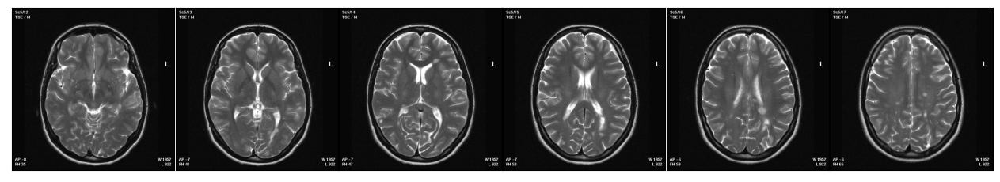

In [3]:
images = read_images(
    './images/Initial & repeat MRI in MS-Free Dataset/AA/1/IM_00034.TIF',
    './images/Initial & repeat MRI in MS-Free Dataset/AA/1/IM_00035.TIF',
    './images/Initial & repeat MRI in MS-Free Dataset/AA/1/IM_00036.TIF',
    './images/Initial & repeat MRI in MS-Free Dataset/AA/1/IM_00037.TIF',
    './images/Initial & repeat MRI in MS-Free Dataset/AA/1/IM_00038.TIF',
    './images/Initial & repeat MRI in MS-Free Dataset/AA/1/IM_00039.TIF'
)
imshow(*images, cols = 6)

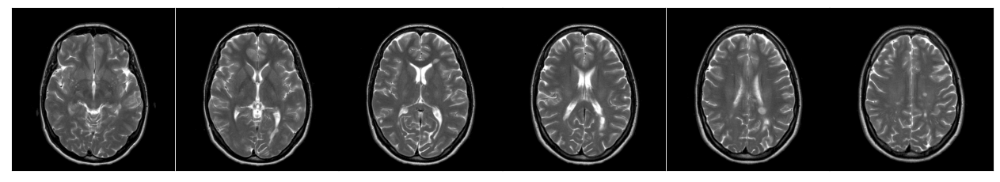

In [4]:
images_gray = remove_text(convert_grayscale(*images))

equalized = equalize_images(*images_gray)
imshow(
    *equalized,
    cols = 6
)

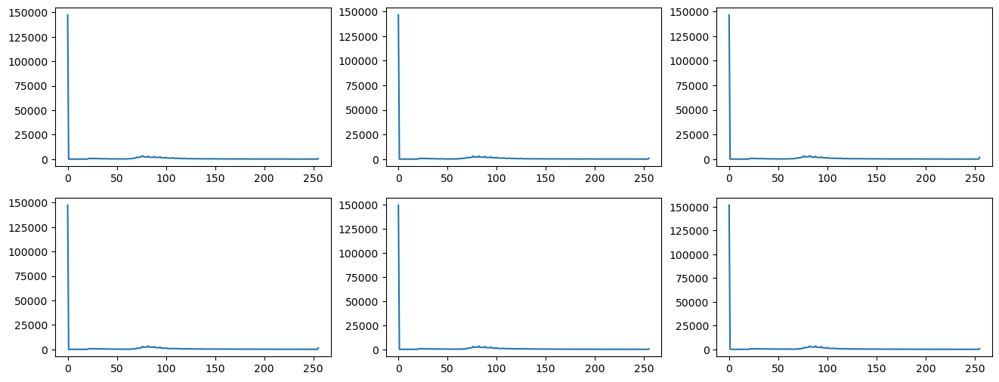

In [5]:
histograms(
    *equalized,
    cols = 3
)

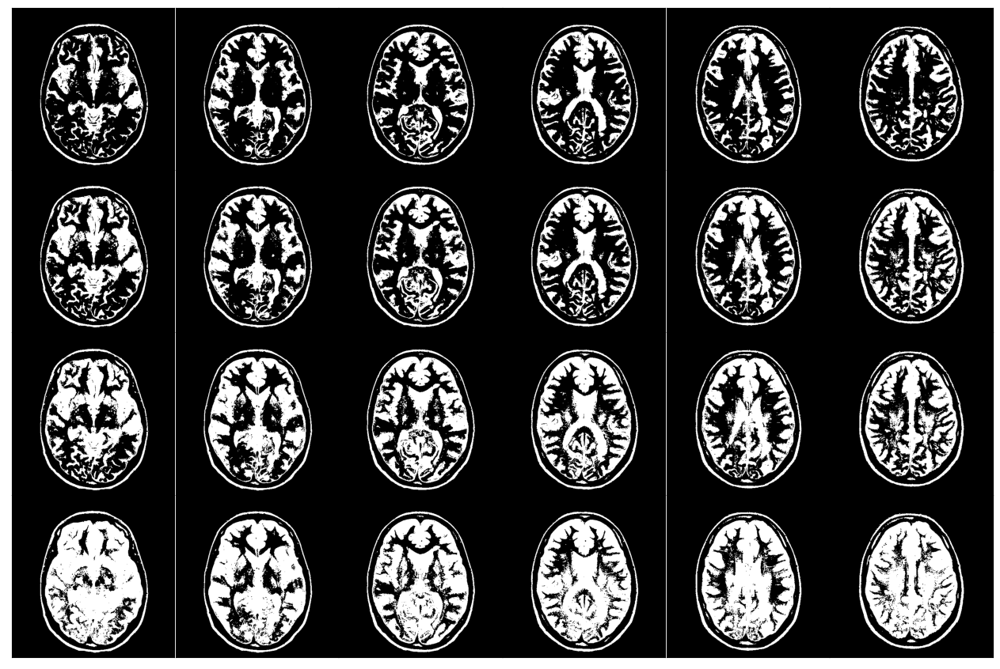

In [43]:
stats = images_stats(*equalized)
mean_threshold = list(map(lambda x: x['mean'], stats))
median_threshold = list(map(lambda x: x['median'], stats))
mode_threshold = find_mode_hist(*equalized, range=range(1, 256))

binarized_otsu = binarize_images(*equalized, threshold = 100)
binarized_mean = binarize_images(*equalized, threshold = mean_threshold)
binarized_median = binarize_images(*equalized, threshold = median_threshold)
binarized_mode = binarize_images(*equalized, threshold = mode_threshold)

imshow(
    *binarized_otsu,
    *binarized_mean,
    *binarized_median,
    *binarized_mode,
    cols = 6
)

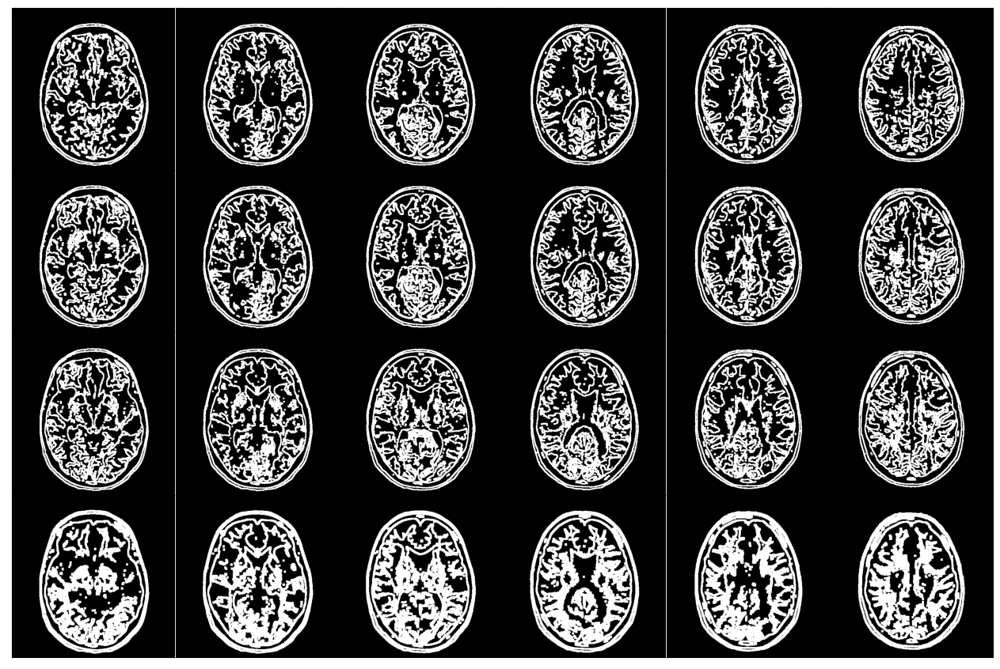

In [58]:
edges_otsu = draw_edges(*binarized_otsu, ksize=5)
edges_mean = draw_edges(*binarized_mean, ksize=5)
edges_median = draw_edges(*binarized_median, ksize=5)
edges_mode = draw_edges(*binarized_mode, ksize=7)
imshow(
    *edges_otsu,
    *edges_mean,
    *edges_median,
    *edges_mode,
    cols = 6
)

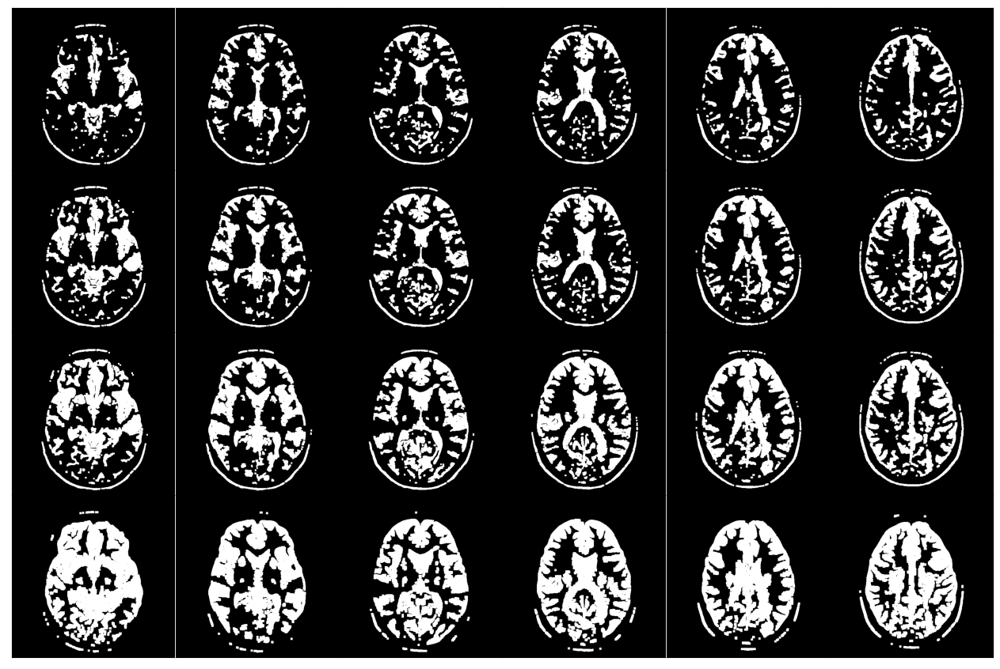

In [59]:
opened_otsu = open_transform(*binarized_otsu, ksize=5)
opened_mean = open_transform(*binarized_mean, ksize=5)
opened_median = open_transform(*binarized_median, ksize=5)
opened_mode = open_transform(*binarized_mode, ksize=7)

imshow(
    *opened_otsu,
    *opened_mean,
    *opened_median,
    *opened_mode,
    cols = 6
)

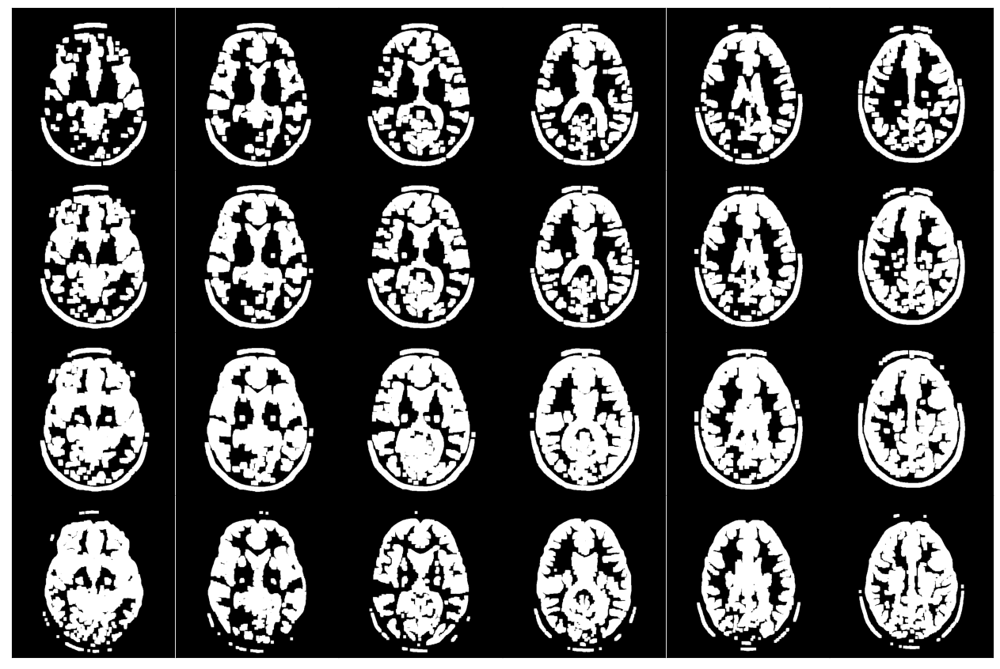

In [62]:
dilated_otsu = dilate_transform(*opened_otsu, ksize=5, iterations=2)
dilated_mean = dilate_transform(*opened_mean, ksize=5, iterations=2)
dilated_median = dilate_transform(*opened_median, ksize=5, iterations=2)
dilated_mode = dilate_transform(*opened_mode, ksize=3, iterations=1)
imshow(
    *dilated_otsu,
    *dilated_mean,
    *dilated_median,
    *dilated_mode,
    cols = 6
)

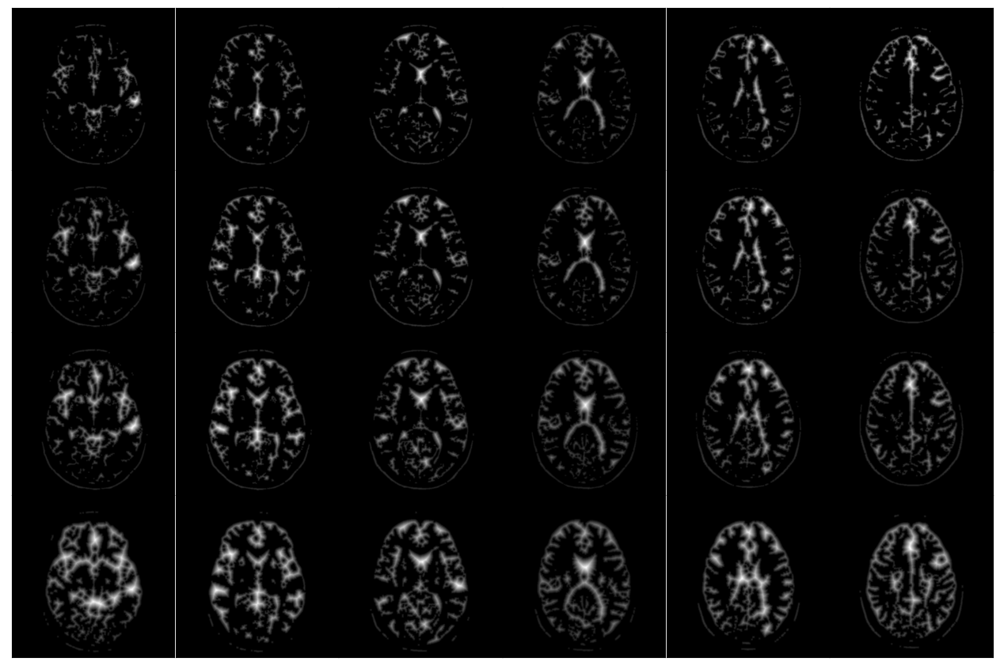

In [63]:
distance_otsu = distance_transform(*opened_otsu, mask_size=5)
distance_mean = distance_transform(*opened_mean, mask_size=5)
distance_median = distance_transform(*opened_median, mask_size=5)
distance_mode = distance_transform(*opened_mode, mask_size=3)
imshow(
    *distance_otsu,
    *distance_mean,
    *distance_median,
    *distance_mode,
    cols = 6
)

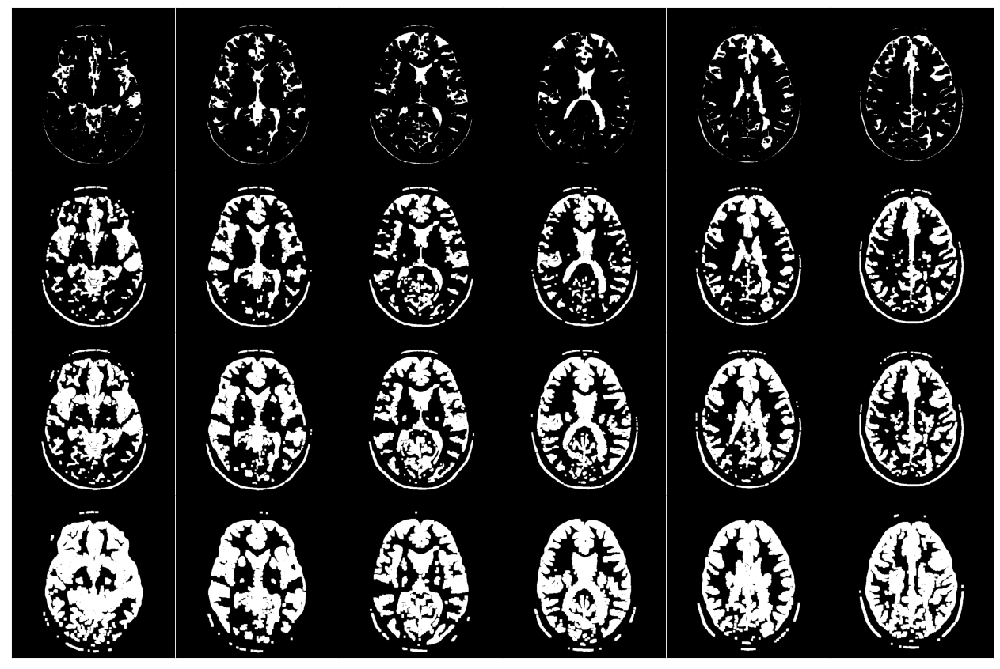

In [64]:
distance_binarized_otsu = binarize_cv(*distance_otsu)
distance_binarized_mean = binarize_cv(*distance_mean, thresh_factor=0.001)
distance_binarized_median = binarize_cv(*distance_median, thresh_factor=0.001)
distance_binarized_mode = binarize_cv(*distance_mode, thresh_factor=0.001)
imshow(
    *distance_binarized_otsu,
    *distance_binarized_mean,
    *distance_binarized_median,
    *distance_binarized_mode,
    cols = 6
)

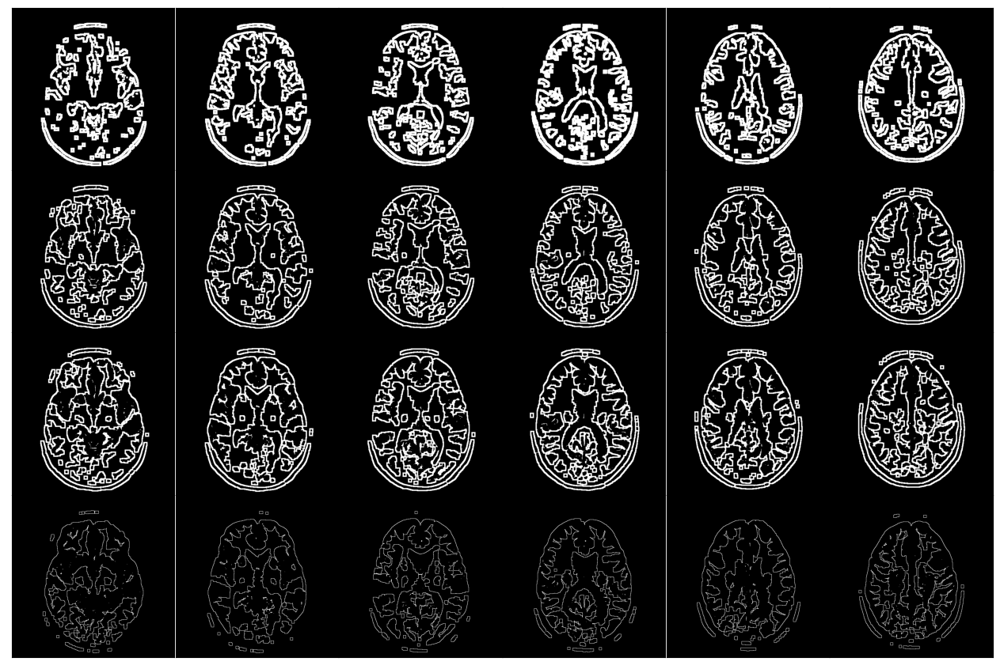

In [65]:
subtracted_otsu = subtract(dilated_otsu, distance_binarized_otsu)
subtracted_mean = subtract(dilated_mean, distance_binarized_mean)
subtracted_median = subtract(dilated_median, distance_binarized_median)
subtracted_mode = subtract(dilated_mode, distance_binarized_mode)
imshow(
    *subtracted_otsu,
    *subtracted_mean,
    *subtracted_median,
    *subtracted_mode,
    cols = 6
)

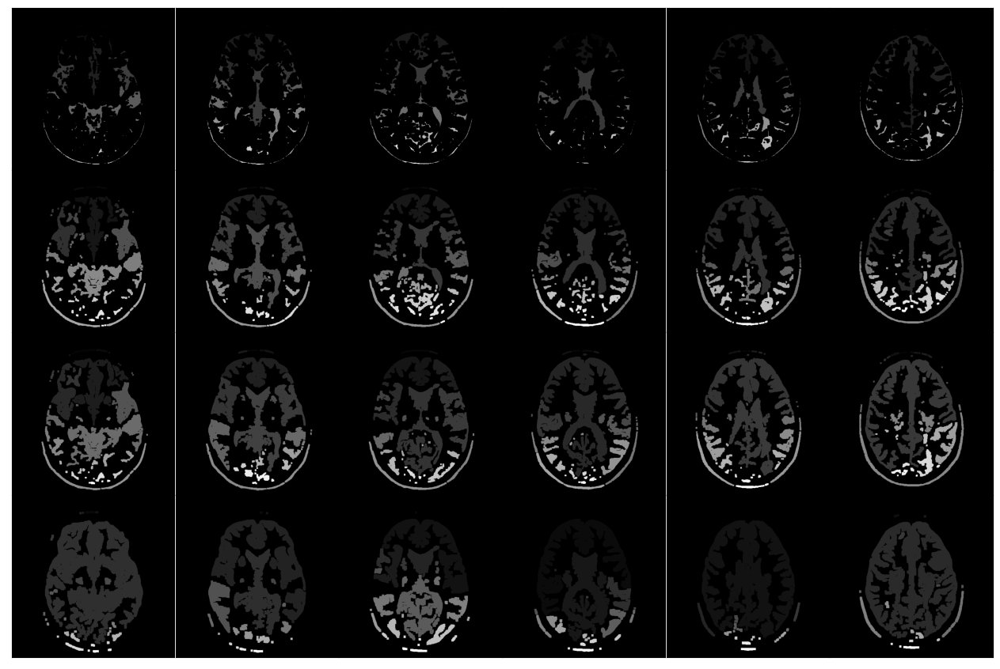

In [66]:
def retrieve_markers(*images):
    transform = lambda img: img.astype('uint8')
    return [transform(cv.connectedComponents(image.astype('uint8'))[1]) for image in images]

markers_otsu = retrieve_markers(*distance_binarized_otsu)
markers_mean = retrieve_markers(*distance_binarized_mean)
markers_median = retrieve_markers(*distance_binarized_median)
markers_mode = retrieve_markers(*distance_binarized_mode)

imshow(
    *markers_otsu,
    *markers_mean,
    *markers_median,
    *markers_mode,
    cols = 6
)

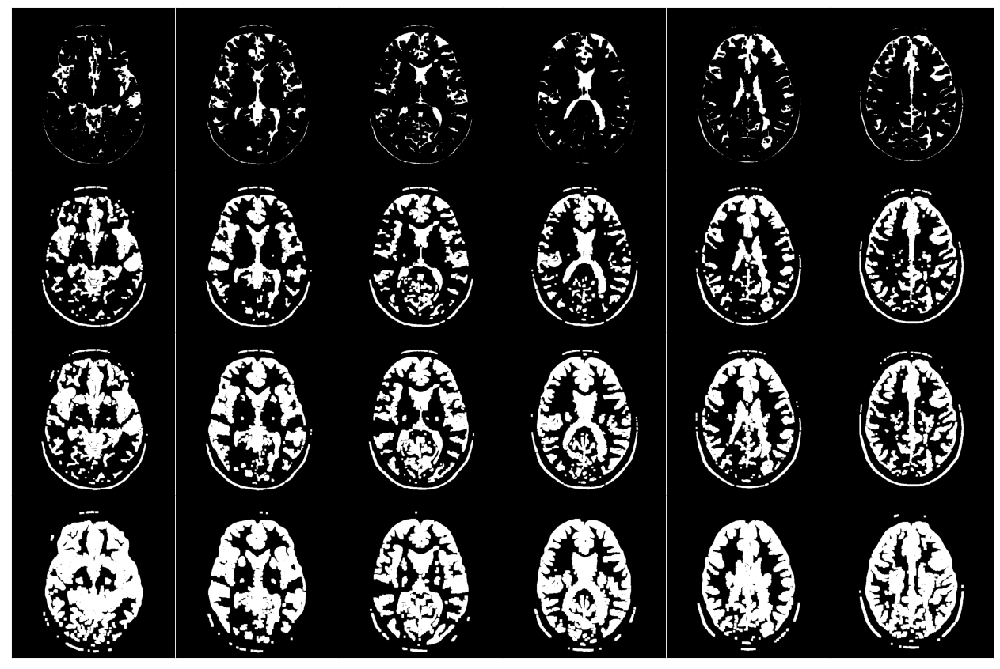

In [67]:
bin_markers_otsu = binarize_cv(*distance_binarized_otsu)
bin_markers_mean = binarize_cv(*distance_binarized_mean)
bin_markers_median = binarize_cv(*distance_binarized_median)
bin_markers_mode = binarize_cv(*distance_binarized_mode)

imshow(
    *bin_markers_otsu,
    *bin_markers_mean,
    *bin_markers_median,
    *bin_markers_mode,
    cols = 6
)

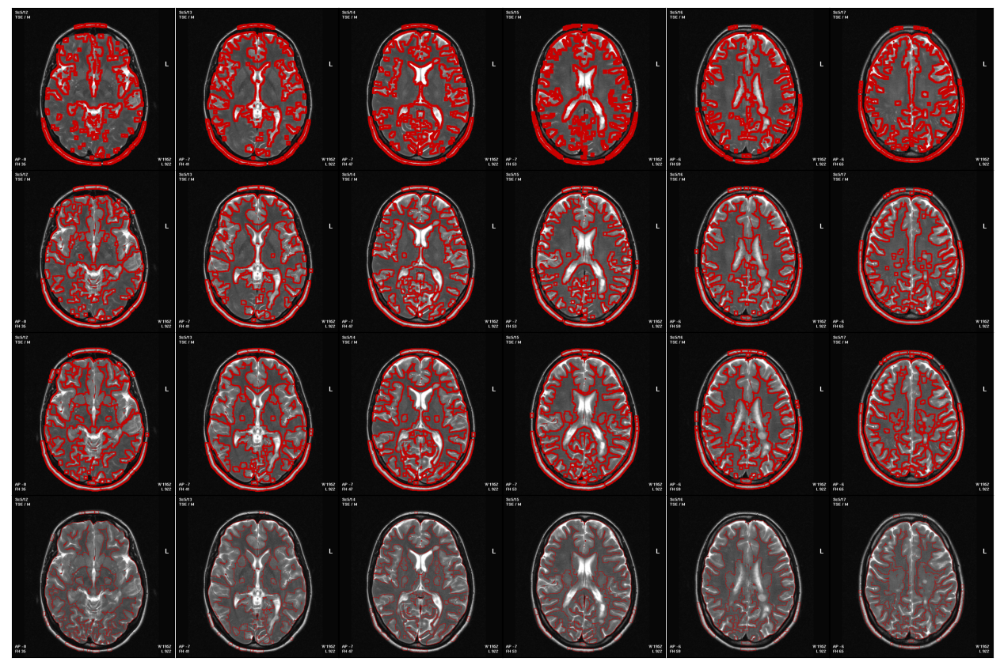

In [68]:
def label_image_borders(images, markers):
    labels = []
    for index, image in enumerate(images):
        label = image.copy()
        label[markers[index] == 1] = [0, 0, 200]
        labels.append(label)
    return labels

labeled_otsu = label_image_borders(images, subtracted_otsu)
labeled_mean = label_image_borders(images, subtracted_mean)
labeled_median = label_image_borders(images, subtracted_median)
labeled_mode = label_image_borders(images, subtracted_mode)
imshow(
    *labeled_otsu,
    *labeled_mean,
    *labeled_median,
    *labeled_mode,
    cols = 6
)

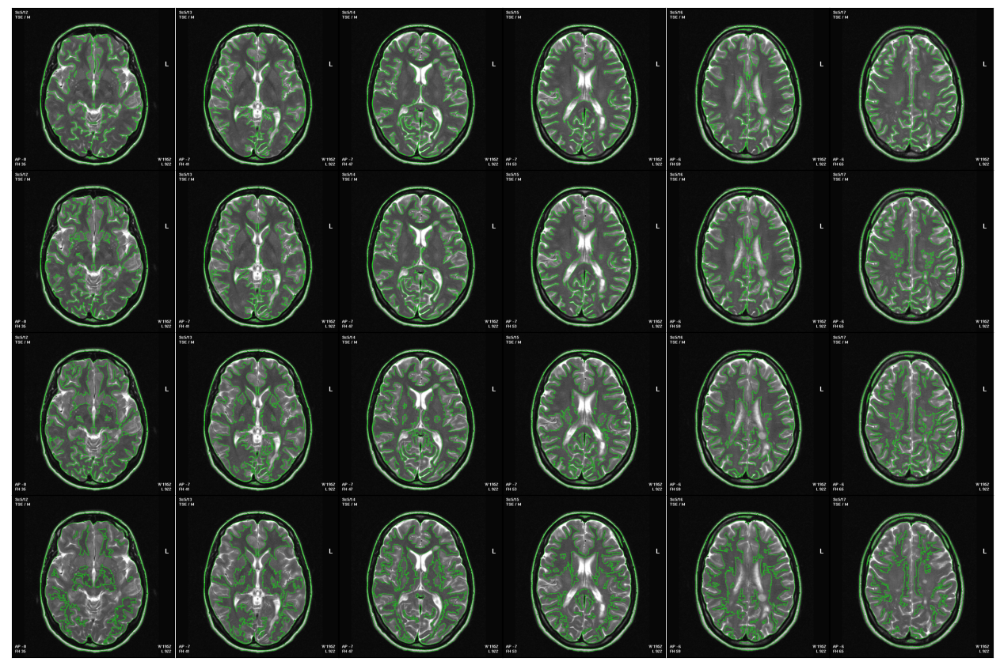

In [69]:
def find_contours(markers):
    m2 = markers
    # ret, m2 = cv.threshold(markers, 0, 255, cv.THRESH_BINARY | cv.THRESH_OTSU)
    contours, hierarchy = cv.findContours(m2, cv.RETR_LIST, cv.CHAIN_APPROX_NONE)
    return contours

def draw_contours(images, markers):
    result = [] 
    for index, image in enumerate(images):
        painted = image.copy()
        contours = find_contours(markers[index])
        for c in contours:
            if(len(c) > 50):
                cv.drawContours(painted, c, -1, (0, 255, 0), 1)
        result.append(painted)
    return result

contours_otsu = draw_contours(images, binarized_otsu)
contours_mean = draw_contours(images, binarized_mean)
contours_median = draw_contours(images, binarized_median)
contours_mode = draw_contours(images, binarized_mode)

imshow(
    *contours_otsu,
    *contours_mean,
    *contours_median,
    *contours_mode,
    cols=6
)

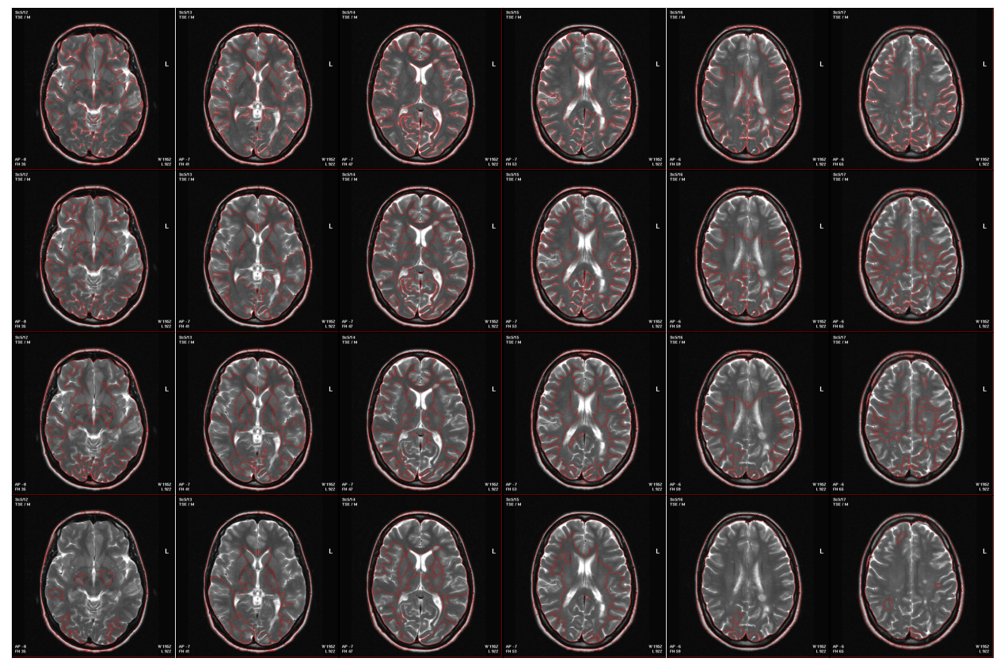

In [70]:
def transform_markers_watershed(images, markers):
    return [cv.watershed(image, markers[index].astype(np.int32)) for index, image in enumerate(images)]

def draw_contours_watershed(images, markers):
    contours = transform_markers_watershed(images, markers)
    result = []
    for index, image_contours in enumerate(contours):
        painted = images[index].copy()
        painted[image_contours == -1] = [0, 0, 255]
        result.append(painted)
    return result

contours_watershed_otsu = draw_contours_watershed(images, markers_otsu)
contours_watershed_mean = draw_contours_watershed(images, markers_mean)
contours_watershed_median = draw_contours_watershed(images, markers_median)
contours_watershed_mode = draw_contours_watershed(images, markers_mode)

imshow(
    *contours_watershed_otsu,
    *contours_watershed_mean,
    *contours_watershed_median,
    *contours_watershed_mode,
    cols = 6
)